# **Assignment 5**
This exercise has two parts:

- Part A consists of mandatory exercises; you need to complete these and hand in your answers to be able to partake in the exam. This part also provides you with an impression of the minimum knowledge level necessary to pass the exam.
- Part B consists of additional exercises. These repeat a concept that is covered in Part A or help to broaden or deepen your understanding of some of the topics.

## Assignment by
Lan Stare, s1169977

Aaron Ritz, s1170346

# **Part A** - Mandatory Exercises
Below you will find the mandatory exercises for Week 5 of the course Data Mining and Machine Learning.

## **Exercise 1** - PCA on the MNIST Dataset

MNIST is a famous dataset that contains the pixel values [and labels] of digitized handwritten digits.  The attribute vectors related to every digit are all gray values from the 28 x 28 image.  These images are turned into vectors by either concatenating all rows or columns of every image into a vector.

The CSV file mnist_test.csv contains the attributes of 10,000 of such images.  The first entry in every row is the digit label, ranging from 0 to 9, the remaining 784 dimensions are the pixel values.

**a.** Load the dataset and display four random images from the dataset as 28 x 28 grayscale images.

      7  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.658  0.659  0.660  \
0     2  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1     1  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2     0  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3     4  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4     1  0    0    0    0    0    0    0    0    0  ...      0      0      0   
...  .. ..  ...  ...  ...  ...  ...  ...  ...  ...  ...    ...    ...    ...   
9994  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   
9995  3  0    0    0    0    0    0    0    0    0  ...      0      0      0   
9996  4  0    0    0    0    0    0    0    0    0  ...      0      0      0   
9997  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
9998  6  0    0    0    0    0    0    0    0    0  ...      0      0      0   

      0.661  0.662  0.663  0.664  0.665

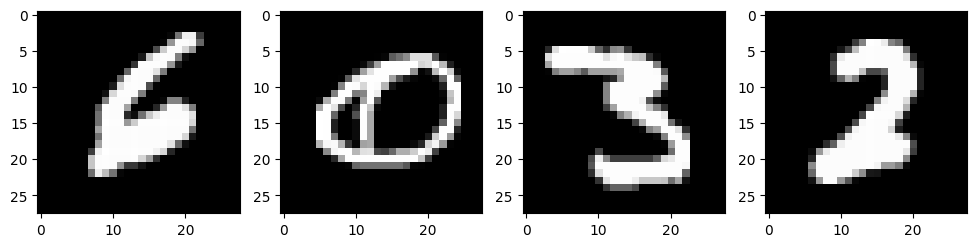

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data = pd.read_csv("mnist_test.csv")
print(data)

labels = data.iloc[:, 0].values   #We use .iloc here because it allows us to specify which columns and rows we want. 0 gives the first column :)
images = data.iloc[:, 1:].values
indeces = np.random.choice(len(images), 4)   #1: gives the rest of the columns; 4 gives four images
print(labels)

#displaying the images:
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
for i, ax in enumerate(axes):
    img = images[indeces[i]].reshape(28, 28) #this is how we reshape the flat vector into 28x28   
    ax.imshow(img, cmap='gray') #we want grayscale images for easier analysis
    
plt.show()


**b.** Are the attribute vectors obtained from the images by concatenating rows or concatenating columns?

ANSWER:

They are obtained by concatenating rows, because when we called 'reshape', we cut the 1D vector into 28 rows of 28 digits. So if we then concatenate the rows, we get the original 1D vector back.

**c.** Using PCA, reduce your dataset from 784 to 3 features.  Display, as $28 \times 28$ images, the mean digit and the three principle components.  Note that in these plots, the same correspondence between pixel position and vector element as in **a** is assumed.

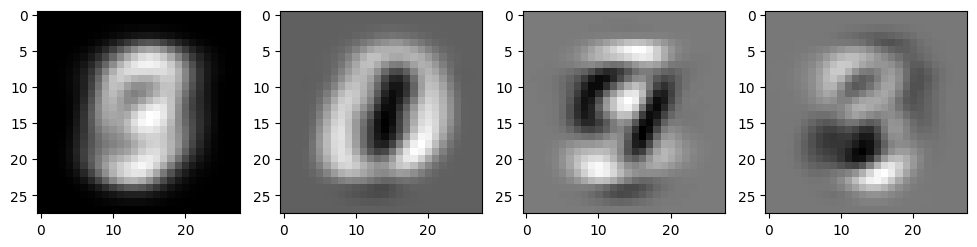

In [5]:
from sklearn.decomposition import PCA
new_data = PCA(n_components=3) #this reduces the dataset to 3 new most important features
new_data.fit(images)

mean_image = new_data.mean_.reshape(28, 28) #we need to first get the mean
#the first 3 principal components (reshaping them into 28x28 images otherwise it doesn't work):
pc1 = new_data.components_[0].reshape(28, 28)
pc2 = new_data.components_[1].reshape(28, 28)
pc3 = new_data.components_[2].reshape(28, 28)

#displaying:
fig, axes = plt.subplots(1, 4, figsize=(12, 3)) #we initiate our 4 images
axes[0].imshow(mean_image, cmap='gray')
axes[1].imshow(pc1, cmap='gray')
axes[2].imshow(pc2, cmap='gray')
axes[3].imshow(pc3, cmap='gray')



**d.** Consider the 1-dimensional dataset determined by the first principal component.  Which two classes are located at the extreme ends, i.e., which classes take on the largest and smallest attribute values?


In [6]:
X_pca = new_data.transform(images) #transforming the data into PCA space (3 features per image)
pc1_scores = X_pca[:, 0] #only taking PCA1

#finding indices of smallest and largest PC1 values:
min_index = np.argmin(pc1_scores)
max_index = np.argmax(pc1_scores)

print(f"Class with smallest PC1 value = {labels[min_index]}, class with largest PCA value = {labels[max_index]}.")

Class with smallest PC1 value = 1, class with largest PCA value = 0.


**e.** In the original 784-dimensional space, calculate the mean vector of the two classes you found in **d**, display their difference vector as a $28 \times 28$, and compare this image to the image of the first principal component you plotted in **c**.  In which direction is this first principal component apparently pointing?



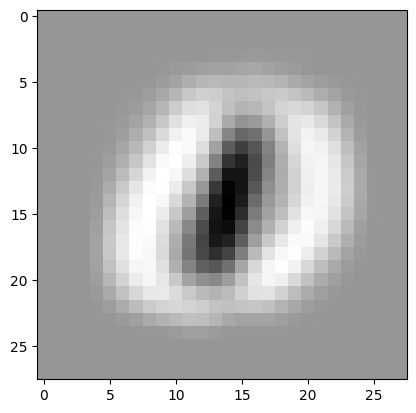

In [7]:
mean_0 = images[labels == 0].mean(axis=0)
mean_1 = images[labels == 1].mean(axis=0)
difference_vector = mean_0 - mean_1

plt.imshow(difference_vector.reshape(28, 28), cmap='gray')

ANSWER:

The first principal component is pointing from class 1 to class 0, since when the difference_vector is defined as mean_1 - mean_0 (when it points from class 0 to class 1), the colors are reversed.

**f.** One measure of how good a lower-dimensional projection of the original data is, can be obtained as the total variance $s$ preserved in this subspace divided by the total variance in the original space $t$.  The total variance is the sum the variances of the individual feature dimensions, which, in turn, equals the trace of the covariance matrix of the data.

Determine the total variance in the original space, the total variance in the 3D subspace obtained by reducing the dimension to 3 by means of PCA, and determine the foregoing measure.

In [8]:
original_total_variance = np.var(images, axis=0).sum() #calculation of original variance (this is t)
d3_total_variance = np.var(new_data.transform(images), axis=0).sum() #variance of the 3D data (this is s)
foregoing_measure = d3_total_variance / original_total_variance #the measure we are looking for (s/t)
print(original_total_variance, d3_total_variance, foregoing_measure)

""" This means that by reducing the dim, we retained about 1 - foregoing_measure of the variance in the data. Since foregoing_measure = 0.237, we retained about 76.3 %. """

3436512.4085136387 815580.2748831502 0.23732790047916785


' This means that by reducing the dim, we retained about 1 - foregoing_measure of the variance in the data. Since foregoing_measure = 0.237, we retained about 76.3 %. '

**g.** If we want the above performance measure to be at least 0.99 [or 99% as it is sometimes referred to] for MNIST, how many principle components should we keep at the very least?


In [9]:
percent_pca = PCA(0.99)
percent_pca.fit_transform(images).shape

(9999, 323)

EXPLANATION:

We need at least 323 components.

## **Exercise 2** - Exercise from Another Doc

Make Exercise 11 from [this document](https://brightspace.ru.nl/d2l/common/viewFile.d2lfile/Content/L2NvbnRlbnQvZW5mb3JjZWQvNTczMjgxLU5XSS1JQkkwMDgtMjAyNS1LVzEtVi9saW5fYWxnX2V4ZXJjaXNlMy5wZGY/lin_alg_exercise3.pdf?ou=573281).

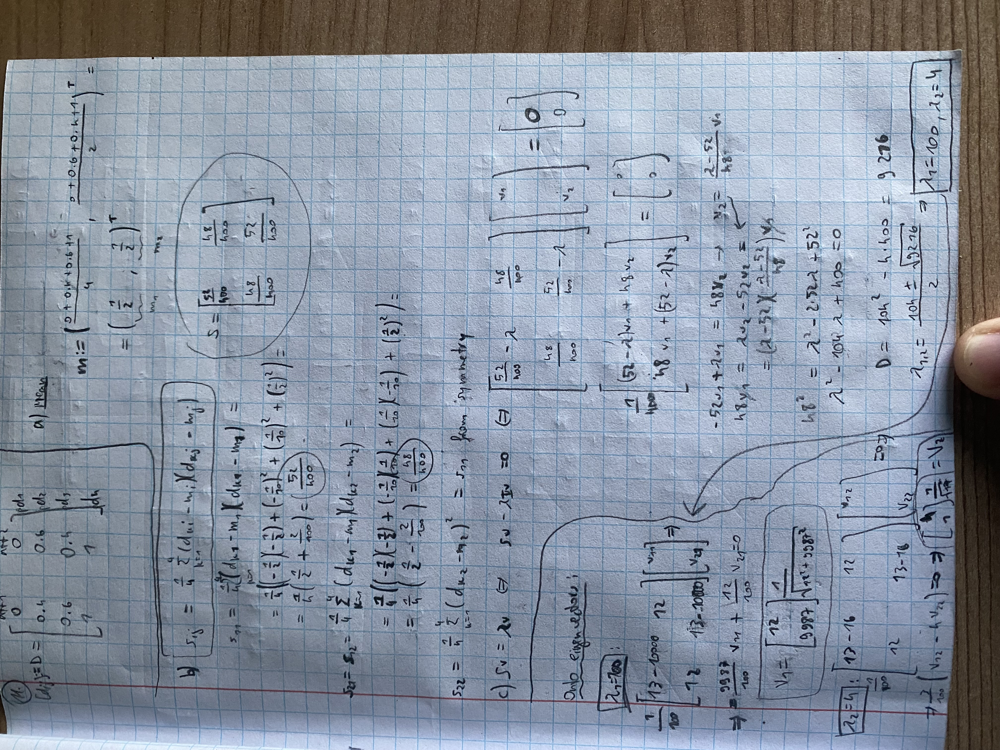

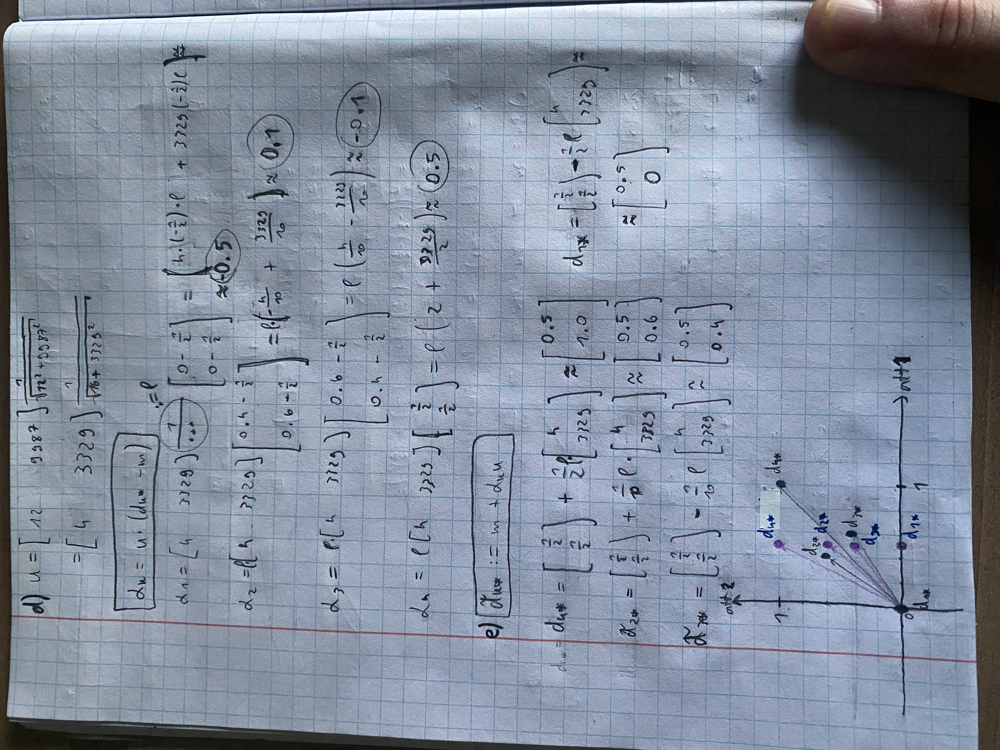

In [10]:
from IPython.display import Image, display

image_path1 = "2ex_1.jpeg"
image_path2 = "2ex_2.jpeg"

display(Image(filename=image_path1), Image(filename=image_path2))

## **Exercise 3** - A bit on optimality of PCA...

Let $C$ be the covariance matrix estimated from some dataset $x_1, x_2, \ldots, x_N$ of $N$ column vectors and let $v$ be a vector of the same size as the vectors in the dataset.

**a.** Show that the variance of all data vectors transformed by $v$, i.e., $v^Tx_1, v^Tx_2, \ldots, v^Tx_N$ equals $v^TCv$.  [To keep things manageable, you could assume that the mean vector of the data equals 0, i.e., the data is mean-centered already.]


**b.** Similar to **a**, the value of $v^TCw$, with $w$ a vector of the same size as $v$, gives the covariance between the two values obtained by transforming all data vectors by $v$ and $w$.  That is, $\mathrm{Cov}(v^Tx,w^Tx) = v^TCw$.

Show the following: if $v$ and $w$ are two different eigenvectors of $C$, then $v^TCw = 0$, i.e., $v^Tx$ and $w^Tx$ are uncorrelated [or decorrelated].


**c.** Assume we are dealing with 2D data. Show that the projection using the [normalized] eigenvector associated with the largest eigenvalue provides the projection for which the variance of the projected data is the largest?  Hint: with $e_1$ and $e_2$ the two [normalized] eigenvectors of C, any projection vector $p$ can be written as $p = \cos(t) e_1 + \sin(t) e_2$ for some $t$ between $0$ and $2\pi$.

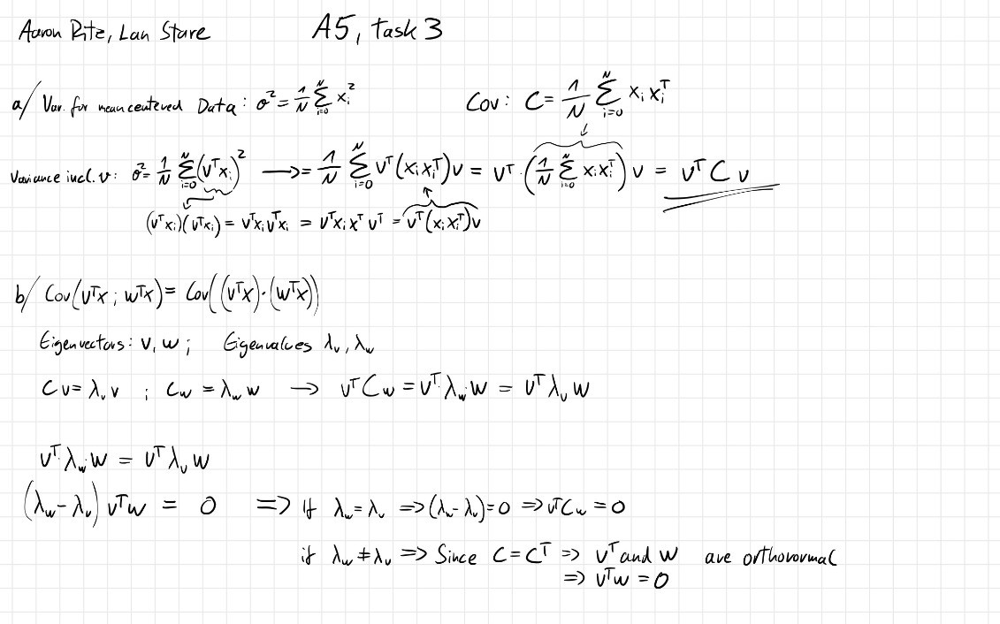

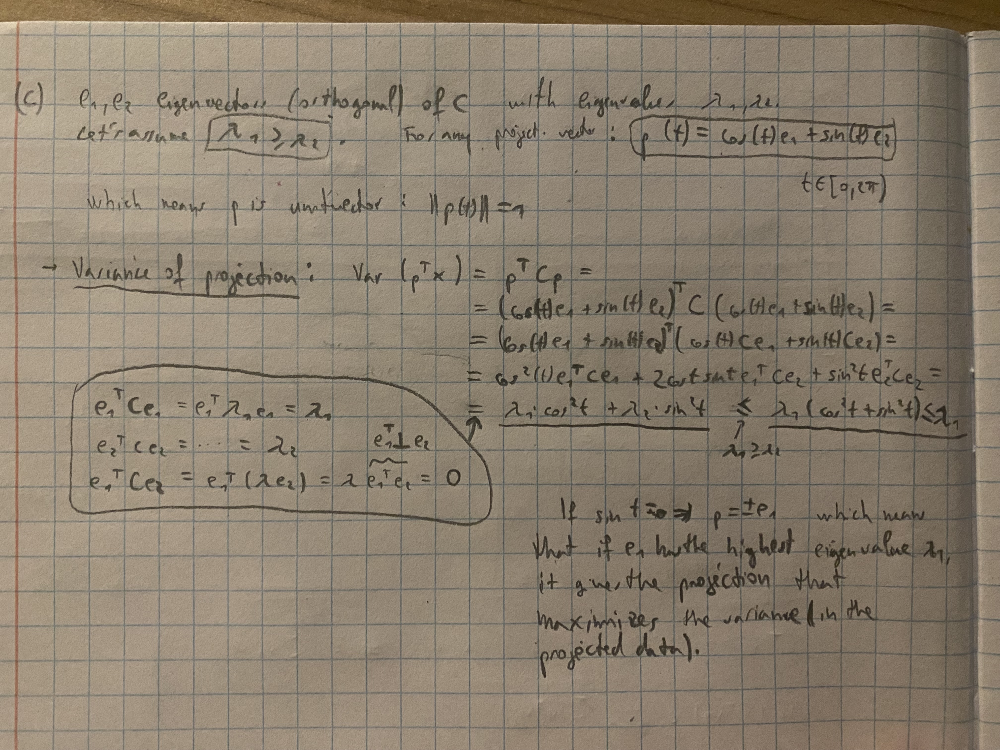

In [12]:
image_path3 = "3ex_ab.jpeg"
image_path4 = "3ex_c.jpeg"

display(Image(filename=image_path3), Image(filename=image_path4))

# **Part B**

## **Exercise 4** - PCA and Iris

**a.** Load the Iris dataset, which was also used in Assignment 1, Week 1.  Determine the first two principle components and reduce the data to 2 dimensoins using these PCs.  Plot [or scatter] this reduced dataset.  Make sure that one distinguish the different classes in your plot.

**b.** How much [i.e., which fraction] of the total variance is preserved in this 2D space?

**c.** Train an LDA on the original dataset and one on the dimensionality-reduced dataset and determine the number of samples that get misclassified for both settings.

**d.** Visualize the decision boundaries for the 2D dataset in the 2D scatter plot.

**e.** Can one also draw the decision boundaries of the LDA trained on the original 4D feaures in the 2D PCA space?

## **Exercise 5** - Watch a Video?

This is not an exercise really...  It's just to share some videos that could help you [or not] to develop some further technical understanding of PCA.

The following series delves into the underlying math: parts [1](https://www.youtube.com/watch?v=lrHboFMio7g), [2](https://www.youtube.com/watch?v=K9RPZh6XMYs), and [3](https://www.youtube.com/watch?v=7tts-flJOlw).  Another option is [this high-level explenation](https://www.youtube.com/watch?v=FgakZw6K1QQ)... but I'm sure you can find other videos, which may be more to your liking.



# Handing in
Hand in the filled-in notebook:
- Make sure your names and student-numbers are mentioned at the appropriate location at the top of this file.
- Make sure you wrote a serious attempt for all exercises in part A
- Make sure the notebook is named groupnumber_assignment1.ipynb

When you are confident all of this is correctly done, one of you can hand in the exercises in Brightspace!